In [ ]:
import tarfile
import os
tar_bz2_file = '/kaggle/input/musiccaps-dataset/music_data.tar.bz2.0'
extract_dir = '/kaggle/working/music_data_extracted/'

os.makedirs(extract_dir,exist_ok=True)

with tarfile.open(tar_bz2_file, 'r:bz2') as tar:
    tar.extractall(path=extract_dir) 

print(f"Extracted files to: {extract_dir}")


In [1]:
import pandas as pd
import os
import numpy as np
import librosa
import tensorflow as tf
import string

# Load the CSV file
df = pd.read_csv("/kaggle/input/musiccaps/musiccaps-public.csv")
aspect_list = df['aspect_list'].tolist()
ytids = df['ytid'].tolist()

# Define the directory containing the .wav files
wav_directory = '/kaggle/working/music_data_extracted/music_data'  
wav_files = os.listdir(wav_directory)

# Initialize mapping dictionary
mapping = {}
for ytid, aspect in zip(ytids, aspect_list):
    wav_filename = f"{ytid}.wav" 
    if wav_filename in wav_files:  
        mapping[ytid] = {
            'aspect': aspect,
            'wav_file': wav_filename
        }

# Function to encode prompts
characters = string.ascii_letters + ' ' + string.punctuation  
char_to_index = {char: index for index, char in enumerate(characters)}

def encode_prompt(prompts):
    encoded_indices = []
    for prompt in prompts:
        prompt_cleaned = prompt.lower()  
        for char in prompt_cleaned:
            if char in char_to_index: 
                encoded_indices.append(char_to_index[char])
    return encoded_indices

# Load and preprocess raw waveform audio files
def load_and_preprocess_audio_files(wav_directory, mapping, sample_rate=22050, duration=3):
    max_length = sample_rate * duration  # Max length in samples
    audio_features = []
    encoded_labels = []

    for ytid, info in mapping.items():
        wav_filename = info['wav_file']
        file_path = os.path.join(wav_directory, wav_filename)

        try:
            y, sr = librosa.load(file_path, sr=sample_rate, duration=duration)
        except FileNotFoundError:
            print(f"Error: File {file_path} not found.")
            continue

        if len(y) < max_length:
            y = np.pad(y, (0, max_length - len(y)), mode='constant')
        elif len(y) > max_length:
            y = y[:max_length]
        
        audio_features.append(y)
        encoded_aspect = encode_prompt([info['aspect']])
        encoded_labels.append(encoded_aspect)

    return audio_features, encoded_labels

# Pad encoded labels
def pad_encoded_labels(encoded_labels, max_length):
    padded_labels = []
    for label in encoded_labels:
        if len(label) < max_length:
            padding_size = max_length - len(label)
            padded_label = label + [0] * padding_size 
        else:
            padded_label = label[:max_length]  
        
        padded_labels.append(padded_label)
    
    return padded_labels

# Main processing
sample_rate = 22050
duration = 3
audio_features, encoded_labels = load_and_preprocess_audio_files(wav_directory, mapping, sample_rate, duration)

max_label_length = max(len(label) for label in encoded_labels)  
padded_encoded_labels = pad_encoded_labels(encoded_labels, max_label_length)

# Custom Dataset for audio and text labels
class AudioTextDataset(tf.data.Dataset):
    def __new__(cls, audio_features, padded_encoded_labels):
        audio_features = np.array(audio_features)
        padded_encoded_labels = np.array(padded_encoded_labels)
        return tf.data.Dataset.from_tensor_slices((audio_features, padded_encoded_labels)).shuffle(buffer_size=10000).batch(32)

audio_text_dataset = AudioTextDataset(audio_features, padded_encoded_labels)

# Verify dataset creation
for audio, label in audio_text_dataset.take(1):
    print(f"Audio shape: {audio.shape}, Label shape: {label.shape}")


Audio shape: (32, 66150), Label shape: (32, 532)


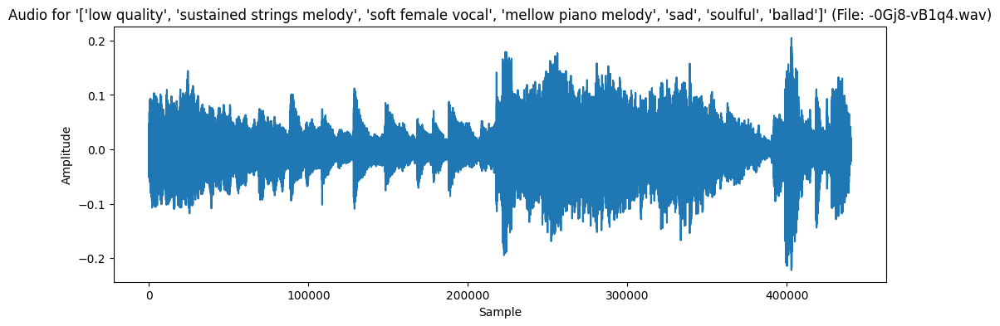

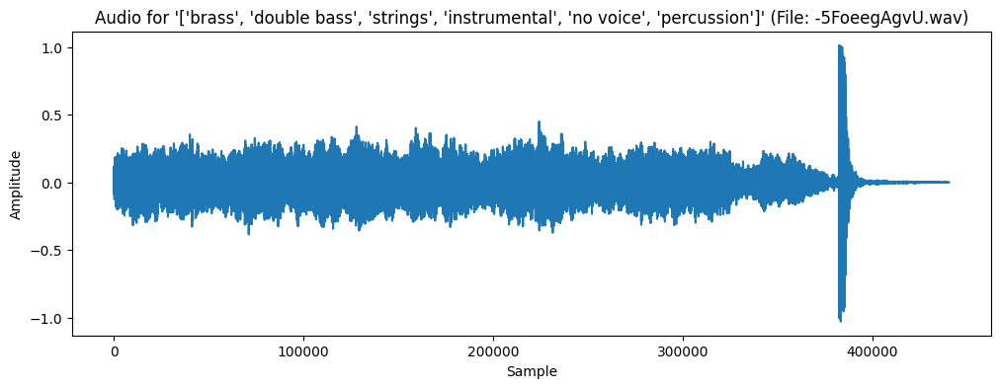

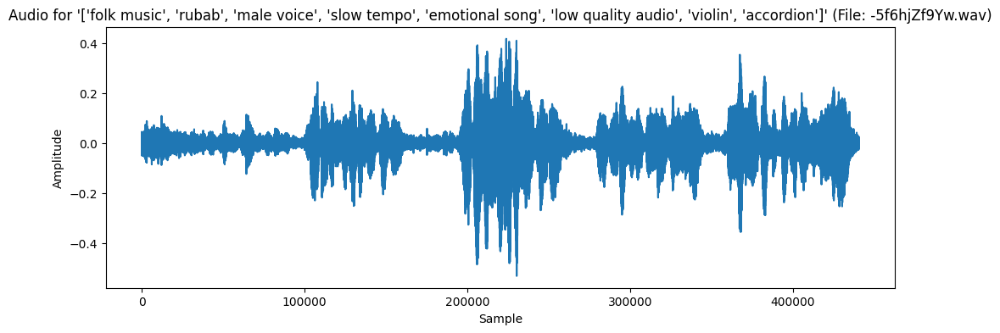

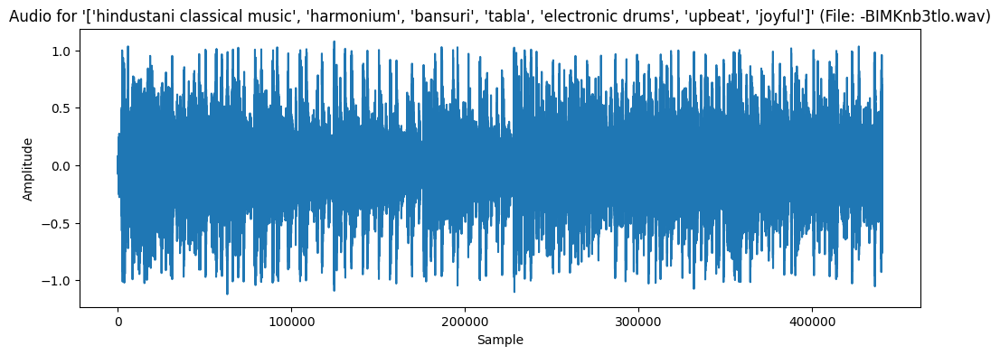

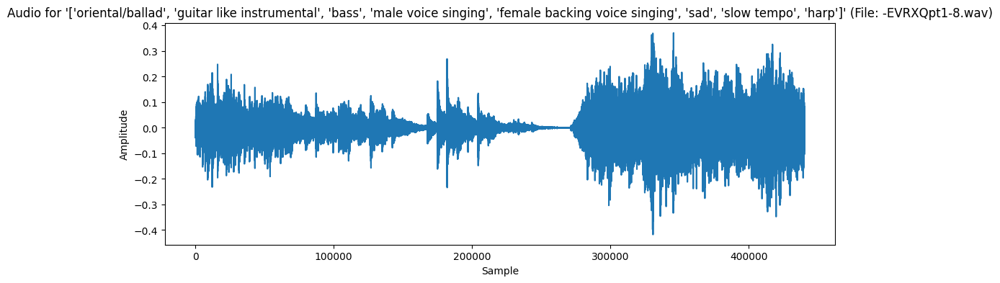

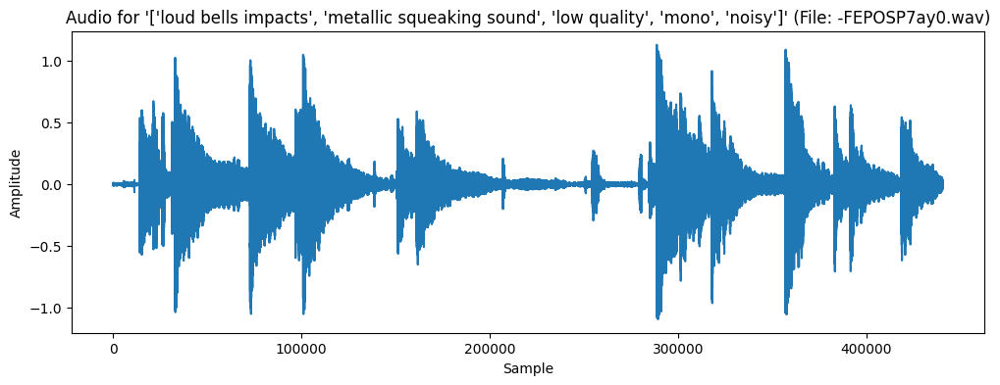

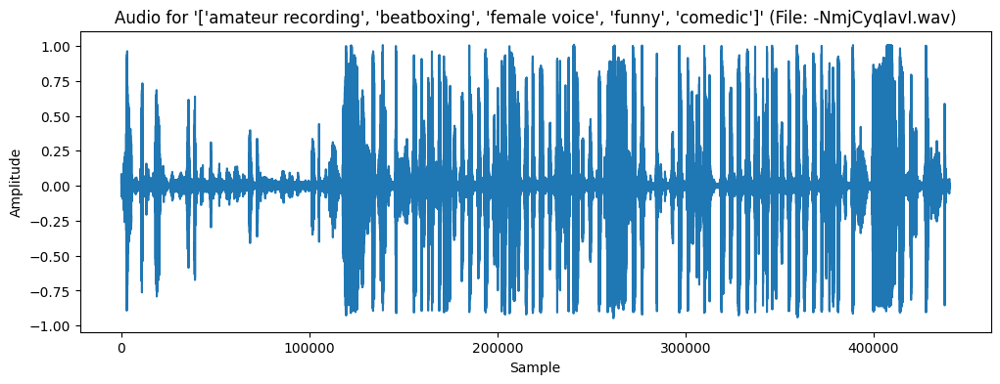

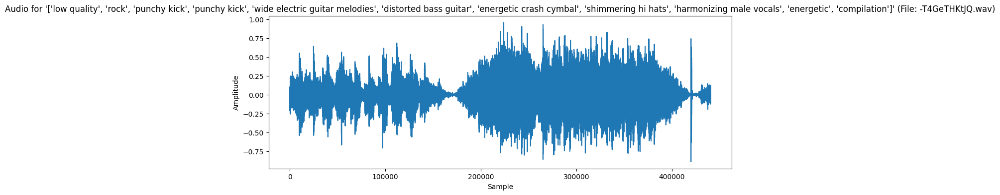

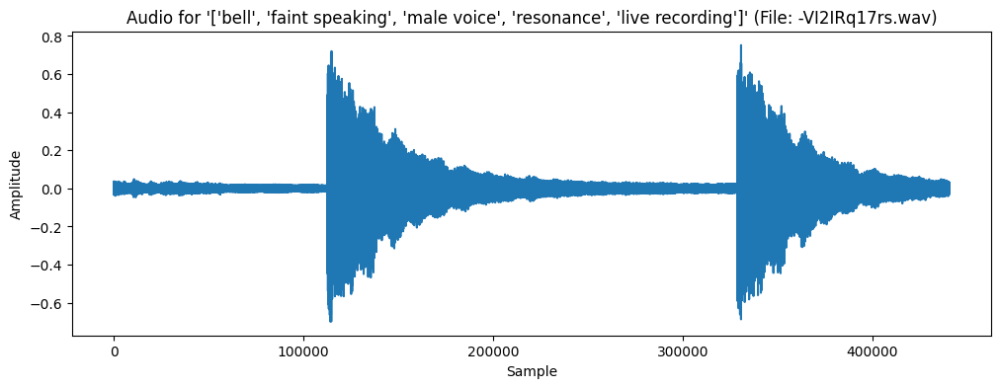

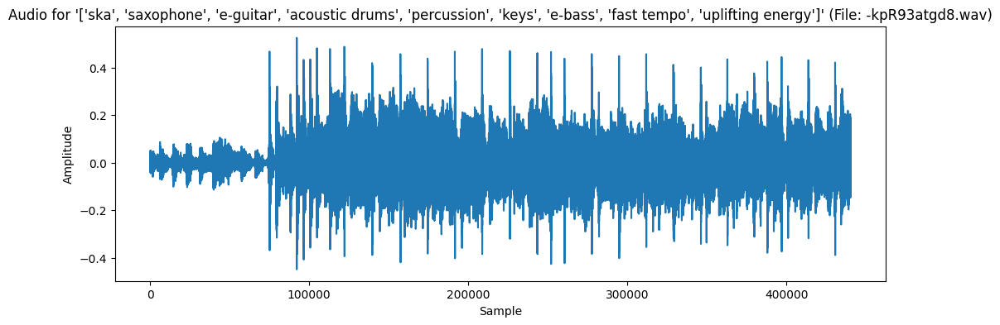

In [3]:
import matplotlib.pyplot as plt
from IPython.display import Audio, display

# Function to display audio and aspect text
def visualize_audio_with_aspect(wav_directory, mapping, num_samples=5, sample_rate=22050):
    samples_shown = 0
    
    for ytid, info in mapping.items():
        if samples_shown >= num_samples:
            break

        wav_filename = info['wav_file']
        aspect_text = info['aspect']
        file_path = os.path.join(wav_directory, wav_filename)

        try:
            # Load the audio file
            y, sr = librosa.load(file_path, sr=sample_rate)
            
            # Plot the waveform
            plt.figure(figsize=(12, 4))
            plt.plot(y)
            plt.title(f"Audio for '{aspect_text}' (File: {wav_filename})")
            plt.xlabel("Sample")
            plt.ylabel("Amplitude")
            plt.show()
            
            # Display audio player
            display(Audio(y, rate=sample_rate))
            
            samples_shown += 1

        except FileNotFoundError:
            print(f"Error: File {file_path} not found.")
            continue

# Example usage
visualize_audio_with_aspect(wav_directory, mapping, num_samples=10)


In [ ]:
class WaveGANGenerator(tf.keras.Model):
    def __init__(self, latent_dim, text_embedding_dim, sample_rate, duration):
        super(WaveGANGenerator, self).__init__()
        self.text_embedding_layer = layers.Dense(text_embedding_dim)
        self.total_samples = sample_rate * duration  # This should equal 66150

        self.main = tf.keras.Sequential([
            layers.Conv1DTranspose(1024, kernel_size=25, strides=10, padding='same', use_bias=False, 
                                   input_shape=(1, latent_dim + text_embedding_dim)),
            layers.BatchNormalization(),
            layers.ReLU(),
            layers.Conv1DTranspose(512, kernel_size=25, strides=7, padding='same', use_bias=False),
            layers.BatchNormalization(),
            layers.ReLU(),
            layers.Conv1DTranspose(256, kernel_size=25, strides=7, padding='same', use_bias=False),
            layers.BatchNormalization(),
            layers.ReLU(),
            layers.Conv1DTranspose(128, kernel_size=25, strides=5, padding='same', use_bias=False),
            layers.BatchNormalization(),
            layers.ReLU(),
            layers.Conv1DTranspose(64, kernel_size=25, strides=3, padding='same', use_bias=False),
            layers.BatchNormalization(),
            layers.ReLU(),
            layers.Conv1DTranspose(32, kernel_size=25, strides=3, padding='same', use_bias=False),
            layers.BatchNormalization(),
            layers.ReLU(),
            layers.Conv1DTranspose(1, kernel_size=25, strides=3, padding='same', use_bias=False),
            layers.Activation('tanh')
        ])
        
    def call(self, noise, text_embedding):
        text_features = self.text_embedding_layer(text_embedding)  
        combined_input = tf.concat([noise, text_features], axis=-1)
        combined_input = tf.expand_dims(combined_input, axis=1)  # Shape (batch_size, 1, latent_dim + text_embedding_dim)

        x = self.main(combined_input)  

        # Ensure the shape matches total_samples
        if tf.shape(x)[1] != self.total_samples:
            raise ValueError(f"Output shape {x.shape[1]} does not match total_samples {self.total_samples}")

        # Reshape to (batch_size, total_samples, 1)
        x = tf.reshape(x, (tf.shape(x)[0], self.total_samples, 1))
    
        return x


class WaveGANDiscriminator(tf.keras.Model):
    def __init__(self, text_embedding_dim):
        super(WaveGANDiscriminator, self).__init__()
        self.text_embedding_layer = layers.Dense(128)

        self.audio_net = tf.keras.Sequential([
            layers.Conv1D(128, kernel_size=25, strides=4, padding='same', use_bias=False),
            layers.LeakyReLU(0.2),
            layers.Conv1D(256, kernel_size=25, strides=4, padding='same', use_bias=False),
            layers.BatchNormalization(),
            layers.LeakyReLU(0.2),
            layers.Conv1D(512, kernel_size=25, strides=4, padding='same', use_bias=False),
            layers.BatchNormalization(),
            layers.LeakyReLU(0.2),
            layers.Flatten(),
            layers.Dense(1)
        ])

    def call(self, x, text_embedding):

    # Remove the last dimension if it's 1 (from (64, 66150, 1) to (64, 66150))
        if tf.shape(x)[-1] == 1:
            x = tf.squeeze(x, axis=-1)  # Now x should be (64, 66150)

        # Get text features
        text_features = self.text_embedding_layer(text_embedding)  # Shape (batch_size, 128)
        text_features = tf.expand_dims(text_features, axis=1)  # Shape now (batch_size, 1, 128)
        text_features = tf.tile(text_features, [1, tf.shape(x)[1], 1])  # Shape now (batch_size, 66150, 128)

        # Concatenate x and text_features along the last dimension
        combined_input = tf.concat([tf.expand_dims(x, axis=-1), text_features], axis=-1)  # Shape: (batch_size, 66150, 1 + 128)

        # Debugging shape after concatenation
        return self.audio_net(combined_input)


In [ ]:
device = "GPU" if tf.test.is_gpu_available() else "CPU"
latent_dim = 100
learning_rate = 0.0002
num_epochs = 100
text_embedding_dim = len(padded_encoded_labels[0])

generator = WaveGANGenerator(latent_dim, text_embedding_dim, sample_rate, duration)
discriminator = WaveGANDiscriminator(text_embedding_dim)
criterion = tf.keras.losses.BinaryCrossentropy(from_logits=True)
optimizer_g = tf.keras.optimizers.Adam(learning_rate, beta_1=0.5, beta_2=0.999)
optimizer_d = tf.keras.optimizers.Adam(0.0001, beta_1=0.5, beta_2=0.999)

In [ ]:
for epoch in range(num_epochs):
    print(f'Epoch [{epoch}/{num_epochs}]')
    for waveforms, text_embeddings in audio_text_dataset:
        
        with tf.GradientTape() as tape_d:
            real_labels = tf.ones((tf.shape(waveforms)[0], 1))
            fake_labels = tf.zeros((tf.shape(waveforms)[0], 1))

            # Discriminator forward pass for real data
            real_outputs = discriminator(waveforms, text_embeddings)
            d_loss_real = criterion(real_labels, real_outputs)

            # Generator forward pass
            noise = tf.random.normal((tf.shape(waveforms)[0], latent_dim))
            fake_samples = generator(noise, text_embeddings)

            # Discriminator forward pass for fake data
            fake_outputs = discriminator(fake_samples, text_embeddings)
            d_loss_fake = criterion(fake_labels, fake_outputs)

            d_loss = d_loss_real + d_loss_fake

        grads_d = tape_d.gradient(d_loss, discriminator.trainable_variables)
        optimizer_d.apply_gradients(zip(grads_d, discriminator.trainable_variables))

        with tf.GradientTape() as tape_g:
            fake_samples = generator(noise, text_embeddings)
            fake_outputs = discriminator(fake_samples, text_embeddings)
            g_loss = criterion(real_labels, fake_outputs)

        grads_g = tape_g.gradient(g_loss, generator.trainable_variables)
        optimizer_g.apply_gradients(zip(grads_g, generator.trainable_variables))

    print(f'End of epoch {epoch}, d_loss: {d_loss.numpy()}, g_loss: {g_loss.numpy()}')